In [ ]:
%pip install matplotlib
%pip install opencv-python
%pip install seaborn
%pip install tensorflow
%pip install scipy
%pip install numpy==1.24.3
%pip install scikit-learn


/var/folders/h2/wm9znrpn1t91bqtr9g3njc7h0000gn/T/ipykernel_93039/1959152890.py:30: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/Users/cavins/Desktop/project/leaf-disease-detector/plantenv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


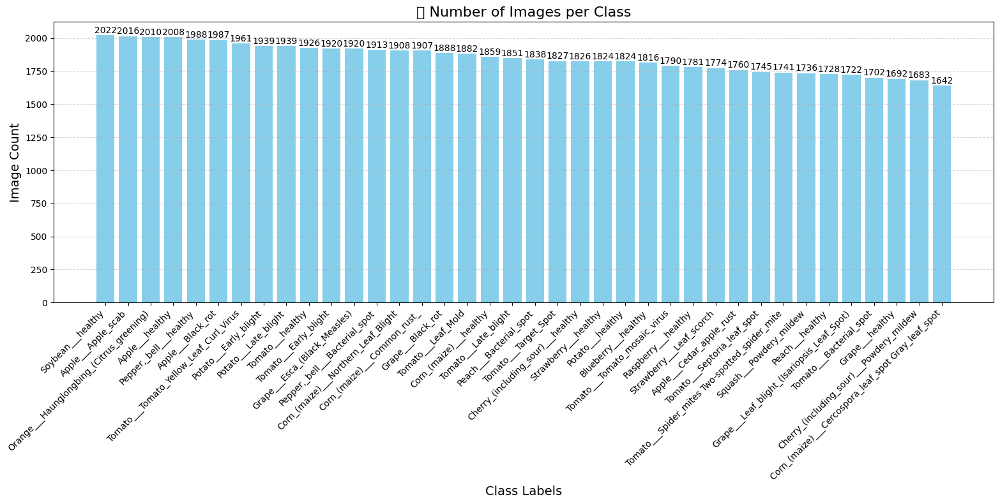

In [ ]:
#dataset summary
import os
from collections import Counter
import matplotlib.pyplot as plt

dataset_path = "/Users/cavins/Desktop/project/leaf-disease-detector/leaf_dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train"  

class_dirs = os.listdir(dataset_path)
class_counts = {}
for class_name in class_dirs:
    class_folder = os.path.join(dataset_path, class_name)
    if os.path.isdir(class_folder):
        class_counts[class_name] = len(os.listdir(class_folder))

class_counts = dict(sorted(class_counts.items(), key=lambda x: x[1], reverse=True))

plt.figure(figsize=(16, 8))  
bars = plt.bar(class_counts.keys(), class_counts.values(), color='skyblue')

plt.xticks(rotation=45, ha='right')
plt.title("📊 Number of Images per Class", fontsize=16)
plt.ylabel("Image Count", fontsize=14)
plt.xlabel("Class Labels", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.5)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 1, f'{height}', ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()


In [ ]:
#image dimension analysis
import cv2

image_shapes = []
for cls in class_dirs:
    img_dir = os.path.join(dataset_path, cls)
    for img_file in os.listdir(img_dir):
        img_path = os.path.join(img_dir, img_file)
        img = cv2.imread(img_path)
        if img is not None:
            image_shapes.append(img.shape)

from collections import Counter
Counter(image_shapes).most_common(5)


[((256, 256, 3), 70295)]

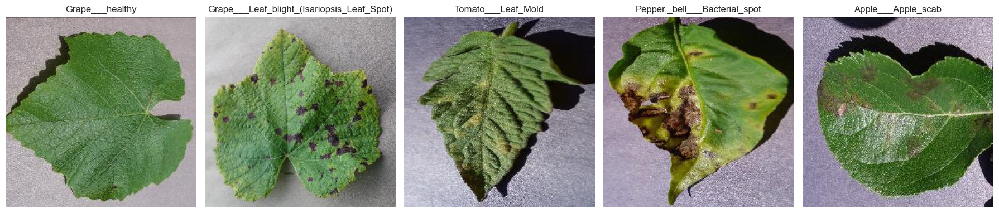

In [35]:
#image display of few classes
import matplotlib.pyplot as plt
import cv2
import random
import os

sample_classes = random.sample(class_dirs, 5)

fig, axs = plt.subplots(1, 5, figsize=(18, 5))  

for i, cls in enumerate(sample_classes):
    img_folder = os.path.join(dataset_path, cls)
    img_file = random.choice(os.listdir(img_folder))
    img_path = os.path.join(img_folder, img_file)

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    axs[i].imshow(img)
    axs[i].set_title(cls)
    axs[i].axis('off')

plt.tight_layout()
plt.show()


/var/folders/h2/wm9znrpn1t91bqtr9g3njc7h0000gn/T/ipykernel_93039/3359095092.py:30: UserWarning: Glyph 127807 (\N{HERB}) missing from font(s) Arial.
  plt.tight_layout()
/var/folders/h2/wm9znrpn1t91bqtr9g3njc7h0000gn/T/ipykernel_93039/3359095092.py:30: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) Arial.
  plt.tight_layout()
/var/folders/h2/wm9znrpn1t91bqtr9g3njc7h0000gn/T/ipykernel_93039/3359095092.py:30: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) Arial.
  plt.tight_layout()
/var/folders/h2/wm9znrpn1t91bqtr9g3njc7h0000gn/T/ipykernel_93039/3359095092.py:30: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) Arial.
  plt.tight_layout()


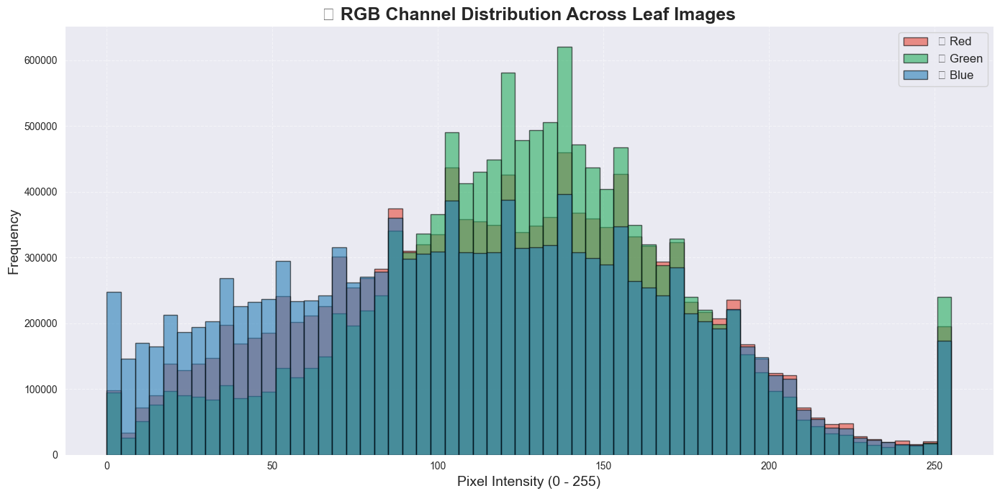

In [ ]:
#color channel histograms
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("darkgrid")

R, G, B = [], [], []
for cls in list(class_counts.keys())[:10]: 
    for img_file in os.listdir(os.path.join(dataset_path, cls))[:20]:
        img = cv2.imread(os.path.join(dataset_path, cls, img_file))
        if img is not None:
            b, g, r = cv2.split(img)
            R.extend(r.flatten())
            G.extend(g.flatten())
            B.extend(b.flatten())

plt.figure(figsize=(14, 7))
plt.hist(R, bins=60, alpha=0.6, label='🔴 Red', color='#e74c3c', edgecolor='black')
plt.hist(G, bins=60, alpha=0.6, label='🟢 Green', color='#27ae60', edgecolor='black')
plt.hist(B, bins=60, alpha=0.6, label='🔵 Blue', color='#2980b9', edgecolor='black')

plt.xlabel('Pixel Intensity (0 - 255)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.title('🌿 RGB Channel Distribution Across Leaf Images', fontsize=18, weight='bold')
plt.legend(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


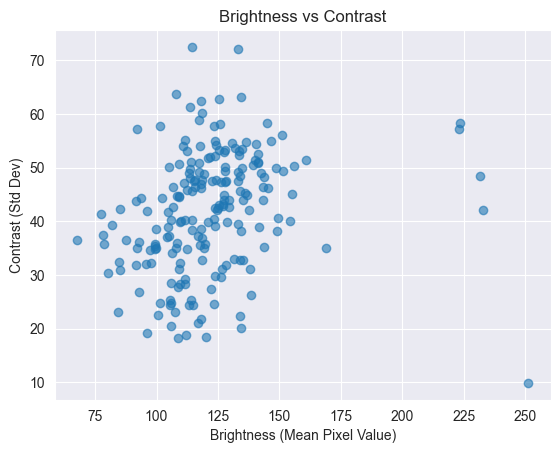

In [16]:
#brightness and contrast distribution
brightness = []
contrast = []

for cls in list(class_counts.keys())[:10]:
    for img_file in os.listdir(os.path.join(dataset_path, cls))[:20]:
        img = cv2.imread(os.path.join(dataset_path, cls, img_file), cv2.IMREAD_GRAYSCALE)
        if img is not None:
            brightness.append(np.mean(img))
            contrast.append(np.std(img))

plt.scatter(brightness, contrast, alpha=0.6)
plt.title("Brightness vs Contrast")
plt.xlabel("Brightness (Mean Pixel Value)")
plt.ylabel("Contrast (Std Dev)")
plt.grid(True)
plt.show()


In [ ]:
#mean and std per chanel
means, stds = [], []
for cls in class_counts:
    for img_file in os.listdir(os.path.join(dataset_path, cls))[:5]:
        img = cv2.imread(os.path.join(dataset_path, cls, img_file))
        if img is not None:
            means.append(np.mean(img, axis=(0, 1)))
            stds.append(np.std(img, axis=(0, 1)))

channel_means = np.mean(means, axis=0)
channel_stds = np.mean(stds, axis=0)

print("Mean per channel [B, G, R]:", channel_means)
print("Std per channel [B, G, R]:", channel_stds)


Mean per channel [B, G, R]: [110.41278598 128.10710345 122.684136  ]
Std per channel [B, G, R]: [50.5341499  39.78972893 46.41227832]


/var/folders/h2/wm9znrpn1t91bqtr9g3njc7h0000gn/T/ipykernel_93039/680658520.py:26: UserWarning: Glyph 128248 (\N{CAMERA WITH FLASH}) missing from font(s) Arial.
  plt.tight_layout()
/Users/cavins/Desktop/project/leaf-disease-detector/plantenv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128248 (\N{CAMERA WITH FLASH}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


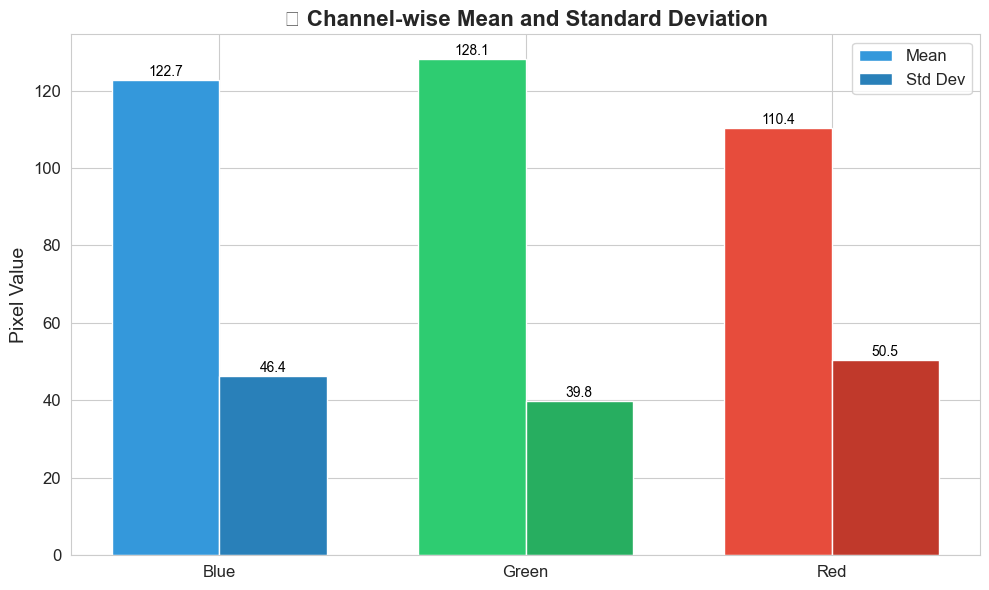

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")

channels = ['Blue', 'Green', 'Red']
mean_vals = channel_means[::-1] 
std_vals = channel_stds[::-1]

x = np.arange(len(channels))  
width = 0.35  

plt.figure(figsize=(10, 6))
plt.bar(x - width/2, mean_vals, width, label='Mean', color=['#3498db', '#2ecc71', '#e74c3c'])
plt.bar(x + width/2, std_vals, width, label='Std Dev', color=['#2980b9', '#27ae60', '#c0392b'])

for i in range(len(channels)):
    plt.text(x[i] - width/2, mean_vals[i] + 1, f'{mean_vals[i]:.1f}', ha='center', fontsize=10, color='black')
    plt.text(x[i] + width/2, std_vals[i] + 1, f'{std_vals[i]:.1f}', ha='center', fontsize=10, color='black')

plt.xticks(x, channels, fontsize=12)
plt.yticks(fontsize=12)
plt.ylabel("Pixel Value", fontsize=14)
plt.title("📸 Channel-wise Mean and Standard Deviation", fontsize=16, weight='bold')
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()


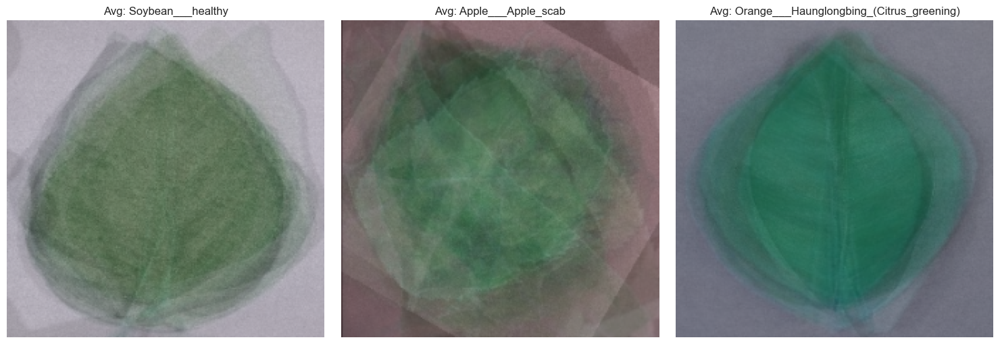

In [ ]:
#class-wise average image 
avg_images = {}

for cls in list(class_counts.keys())[:3]:  # just a few for speed
    img_stack = []
    for img_file in os.listdir(os.path.join(dataset_path, cls))[:10]:
        img = cv2.imread(os.path.join(dataset_path, cls, img_file))
        if img is not None:
            img = cv2.resize(img, (224, 224)) / 255.0
            img_stack.append(img)

    if img_stack:
        avg_img = np.mean(img_stack, axis=0)
        avg_images[cls] = avg_img

plt.figure(figsize=(15, 5))
for i, (cls, avg_img) in enumerate(avg_images.items()):
    plt.subplot(1, len(avg_images), i+1)
    plt.imshow(avg_img)
    plt.title(f"Avg: {cls}")
    plt.axis('off')
plt.tight_layout()
plt.show()


/var/folders/h2/wm9znrpn1t91bqtr9g3njc7h0000gn/T/ipykernel_93039/2416153220.py:38: UserWarning: Glyph 127807 (\N{HERB}) missing from font(s) Arial.
  plt.tight_layout()
/Users/cavins/Desktop/project/leaf-disease-detector/plantenv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 127807 (\N{HERB}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


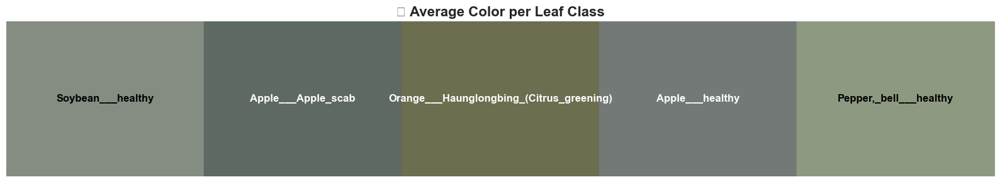

In [ ]:
#classwise color dominance
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt

avg_colors = {}

for cls in list(class_counts.keys())[:5]:
    class_path = os.path.join(dataset_path, cls)
    pixels = []

    for img_file in os.listdir(class_path)[:10]:
        img = cv2.imread(os.path.join(class_path, img_file))
        if img is not None:
            img = cv2.resize(img, (224, 224))
            pixels.append(img.reshape(-1, 3))

    all_pixels = np.vstack(pixels)
    avg_color = np.mean(all_pixels, axis=0)
    avg_colors[cls] = avg_color

plt.figure(figsize=(16, 3))
for i, (cls, color) in enumerate(avg_colors.items()):
    color_rgb = color[::-1] / 255.0  

    plt.fill_between([i, i+1], 0, 1, color=color_rgb)

    plt.text(i + 0.5, 0.5, cls, ha='center', va='center', fontsize=12, fontweight='bold', color='white' if np.mean(color_rgb) < 0.5 else 'black')

plt.xlim(0, len(avg_colors))
plt.ylim(0, 1)
plt.axis('off')
plt.title("🌿 Average Color per Leaf Class", fontsize=16, weight='bold')
plt.tight_layout()
plt.show()


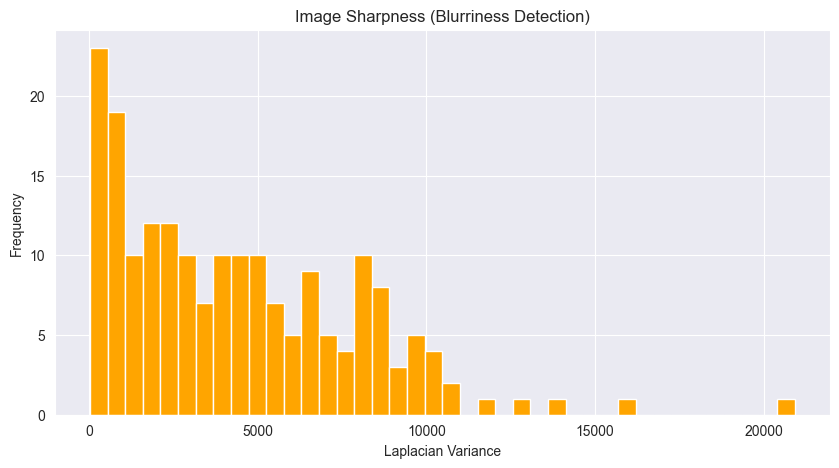

In [23]:
#image sharpness distribution
sharpness_scores = []

for cls in class_counts:
    for img_file in os.listdir(os.path.join(dataset_path, cls))[:5]:
        img = cv2.imread(os.path.join(dataset_path, cls, img_file), cv2.IMREAD_GRAYSCALE)
        if img is not None:
            variance = cv2.Laplacian(img, cv2.CV_64F).var()
            sharpness_scores.append(variance)

plt.figure(figsize=(10, 5))
plt.hist(sharpness_scores, bins=40, color='orange')
plt.title("Image Sharpness (Blurriness Detection)")
plt.xlabel("Laplacian Variance")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()


/var/folders/h2/wm9znrpn1t91bqtr9g3njc7h0000gn/T/ipykernel_93039/3813569868.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(
/var/folders/h2/wm9znrpn1t91bqtr9g3njc7h0000gn/T/ipykernel_93039/3813569868.py:56: UserWarning: Glyph 128161 (\N{ELECTRIC LIGHT BULB}) missing from font(s) Arial.
  plt.tight_layout()
/Users/cavins/Desktop/project/leaf-disease-detector/plantenv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128161 (\N{ELECTRIC LIGHT BULB}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


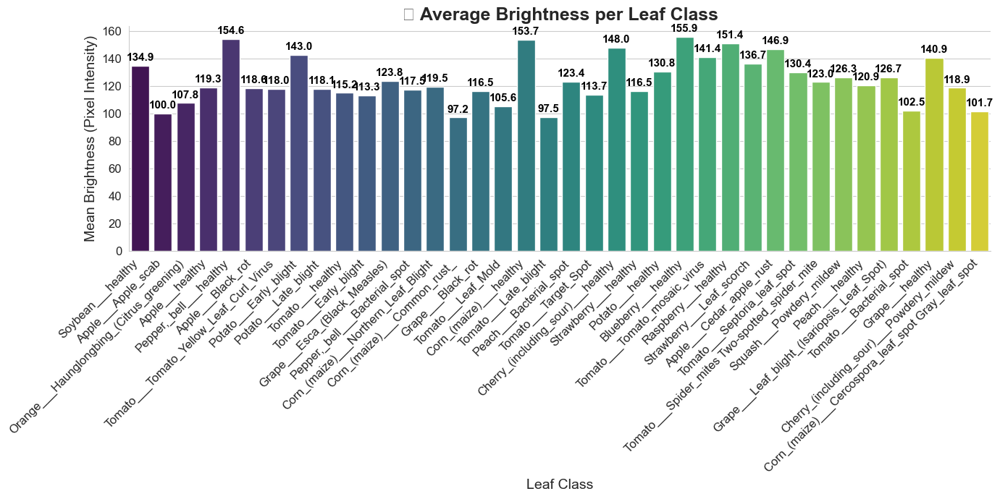

In [ ]:
#classwise average brightness
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import cv2
import os

avg_brightness = {}
for cls in class_counts:
    brightness_vals = []
    for img_file in os.listdir(os.path.join(dataset_path, cls))[:5]:
        img = cv2.imread(os.path.join(dataset_path, cls, img_file), cv2.IMREAD_GRAYSCALE)
        if img is not None:
            brightness_vals.append(np.mean(img))
    avg_brightness[cls] = np.mean(brightness_vals)

sns.set_style("whitegrid")
plt.figure(figsize=(14, 7))

colors = sns.color_palette("viridis", len(avg_brightness))

bars = sns.barplot(
    x=list(avg_brightness.keys()), 
    y=list(avg_brightness.values()), 
    palette=colors
)

plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel("Leaf Class", fontsize=14)
plt.ylabel("Mean Brightness (Pixel Intensity)", fontsize=14)
plt.title("💡 Average Brightness per Leaf Class", fontsize=18, weight='bold')

for bar in bars.patches:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height + 2,
        f'{height:.1f}',
        ha='center',
        va='bottom',
        fontsize=11,
        color='black',
        weight='bold'
    )

sns.despine()

plt.tight_layout()
plt.show()


In [ ]:
#above everything all are eda, next everything will be fully pipelining

In [ ]:
#resizing all images
import cv2
import numpy as np

def resize_image(img, size=(224, 224)):
    return cv2.resize(img, size)


In [2]:
#normalizing pixel values
def normalize_image(img):
    return img / 255.0


In [ ]:
#ok pipelining done, now were going insde training

In [24]:
#importing all libraries
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint


In [25]:
#defining dataset path and calss count
train_dir = "/Users/cavins/Desktop/project/leaf-disease-detector/leaf_dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train"
valid_dir = "/Users/cavins/Desktop/project/leaf-disease-detector/leaf_dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid"
image_size = (224, 224)
batch_size = 32
epochs = 20


In [26]:
#image augmentation and data generators
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2]
)

# Validation data (no augmentation)
val_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='sparse'
)

val_generator = val_datagen.flow_from_directory(
    valid_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='sparse'
)

# Get number of classes
num_classes = train_generator.num_classes
class_names = list(train_generator.class_indices.keys())
print("Detected classes:", class_names)




Found 70295 images belonging to 38 classes.
Found 17572 images belonging to 38 classes.
Detected classes: ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_

In [27]:
#mobilenetv2 setup
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False  

model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(num_classes, activation='softmax') 
])



In [28]:
model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 38)             │         4,902 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,426,854 (9.26 MB)

 Trainable params: 168,870 (659.65 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [22]:
#setting callbacks
callbacks = [
    EarlyStopping(patience=5, restore_best_weights=True),
    ModelCheckpoint("best_model.keras", save_best_only=True)
]


In [29]:
#training the model
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=epochs,
    callbacks=callbacks
)


Epoch 1/20
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 1087s 494ms/step - accuracy: 0.6912 - loss: 1.0795 - val_accuracy: 0.9138 - val_loss: 0.2679
Epoch 2/20
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 1057s 481ms/step - accuracy: 0.8826 - loss: 0.3589 - val_accuracy: 0.9177 - val_loss: 0.2534
Epoch 3/20
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 1099s 500ms/step - accuracy: 0.8978 - loss: 0.3063 - val_accuracy: 0.9227 - val_loss: 0.2330
Epoch 4/20
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 1118s 509ms/step - accuracy: 0.9047 - loss: 0.2850 - val_accuracy: 0.9321 - val_loss: 0.1924
Epoch 5/20
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 1123s 511ms/step - accuracy: 0.9094 - loss: 0.2664 - val_accuracy: 0.9360 - val_loss: 0.1893
Epoch 6/20
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 1108s 504ms/step - accuracy: 0.9158 - loss: 0.2546 - val_accuracy: 0.9342 - val_loss: 0.1986
Epoch 7/20
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 1078s 491ms/step - accuracy: 0.9199 - loss: 0.2451 - val_accuracy: 0.9427 - val_loss: 0.1733
Epoch 8/20
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 1065s 485ms/s

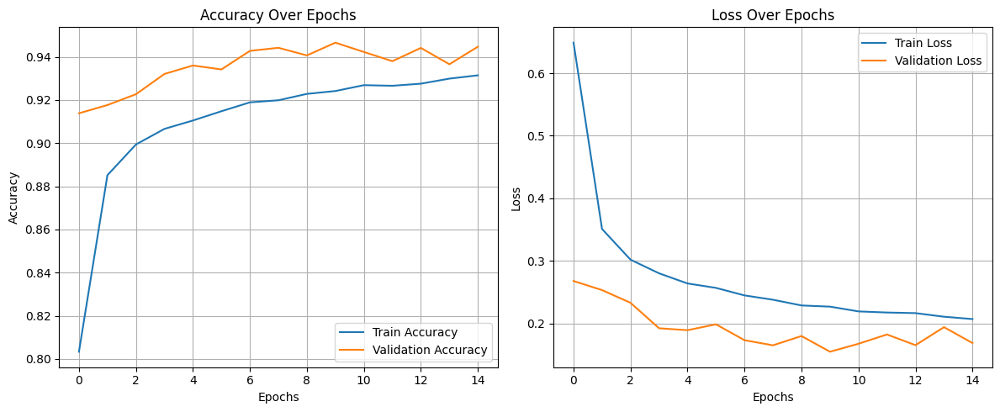

In [30]:
plt.figure(figsize=(12, 5))

# Accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title("Accuracy Over Epochs")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)

# Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title("Loss Over Epochs")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


In [32]:
model.save("final_leaf_disease_model.keras")
print("Model saved as final_leaf_disease_model.keras")
print("Class label mapping:")
print(train_generator.class_indices)


Model saved as final_leaf_disease_model.keras
Class label mapping:
{'Apple___Apple_scab': 0, 'Apple___Black_rot': 1, 'Apple___Cedar_apple_rust': 2, 'Apple___healthy': 3, 'Blueberry___healthy': 4, 'Cherry_(including_sour)___Powdery_mildew': 5, 'Cherry_(including_sour)___healthy': 6, 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot': 7, 'Corn_(maize)___Common_rust_': 8, 'Corn_(maize)___Northern_Leaf_Blight': 9, 'Corn_(maize)___healthy': 10, 'Grape___Black_rot': 11, 'Grape___Esca_(Black_Measles)': 12, 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 13, 'Grape___healthy': 14, 'Orange___Haunglongbing_(Citrus_greening)': 15, 'Peach___Bacterial_spot': 16, 'Peach___healthy': 17, 'Pepper,_bell___Bacterial_spot': 18, 'Pepper,_bell___healthy': 19, 'Potato___Early_blight': 20, 'Potato___Late_blight': 21, 'Potato___healthy': 22, 'Raspberry___healthy': 23, 'Soybean___healthy': 24, 'Squash___Powdery_mildew': 25, 'Strawberry___Leaf_scorch': 26, 'Strawberry___healthy': 27, 'Tomato___Bacterial_spot': 2

550/550 ━━━━━━━━━━━━━━━━━━━━ 90s 164ms/step


/var/folders/h2/wm9znrpn1t91bqtr9g3njc7h0000gn/T/ipykernel_96282/3606555629.py:30: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/Users/cavins/Desktop/project/leaf-disease-detector/plantenv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


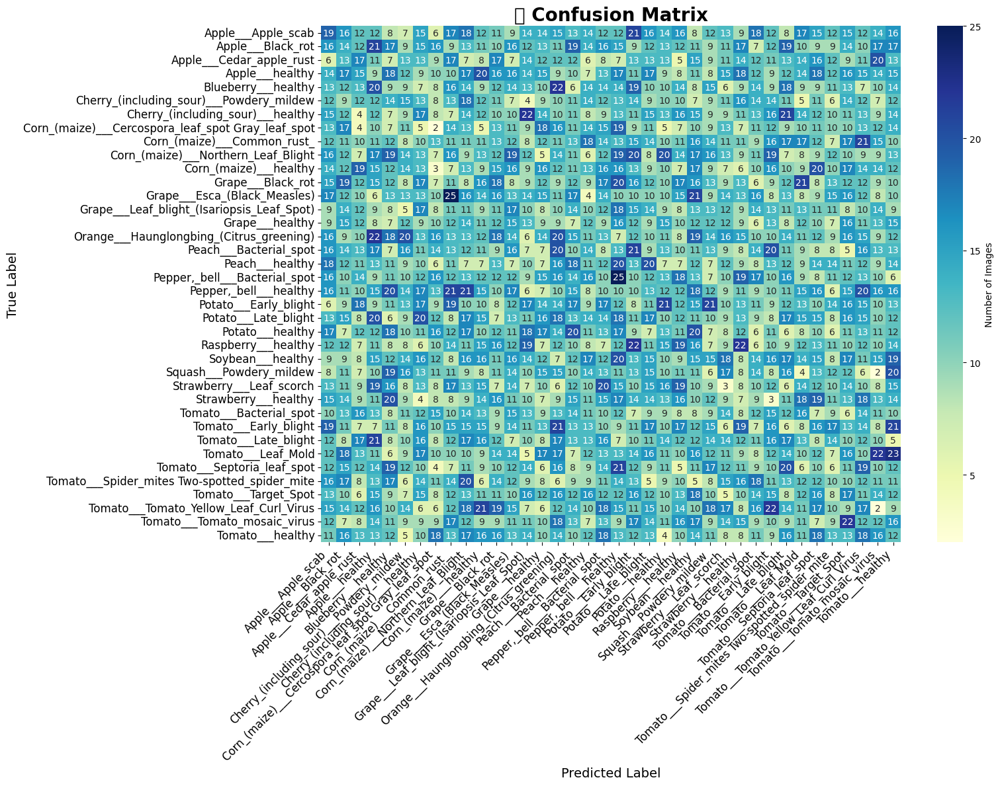

In [36]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

y_true = val_generator.classes
y_pred_probs = model.predict(val_generator, verbose=1)
y_pred = np.argmax(y_pred_probs, axis=1)

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(16, 12))  # 🔍 Bigger plot
sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    cmap='YlGnBu',
    xticklabels=class_names,
    yticklabels=class_names,
    cbar_kws={'label': 'Number of Images'}
)

plt.title("📊 Confusion Matrix", fontsize=20, weight='bold')
plt.xlabel("Predicted Label", fontsize=14)
plt.ylabel("True Label", fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


/var/folders/h2/wm9znrpn1t91bqtr9g3njc7h0000gn/T/ipykernel_96282/2278873927.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(x=classes, y=accuracies, palette='viridis')
/var/folders/h2/wm9znrpn1t91bqtr9g3njc7h0000gn/T/ipykernel_96282/2278873927.py:44: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) Arial.
  plt.tight_layout()
/Users/cavins/Desktop/project/leaf-disease-detector/plantenv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


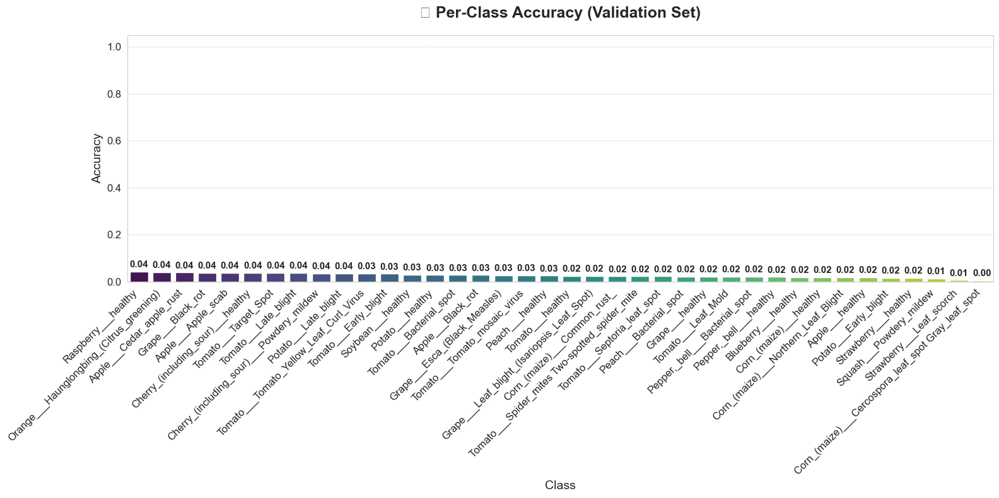

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

correct = (y_pred == y_true)
class_wise_acc = {}

for idx, name in enumerate(class_names):
    class_idx = np.where(y_true == idx)[0]
    acc = np.mean(correct[class_idx])
    class_wise_acc[name] = acc

sorted_acc = dict(sorted(class_wise_acc.items(), key=lambda x: x[1], reverse=True))
classes = list(sorted_acc.keys())
accuracies = list(sorted_acc.values())

plt.figure(figsize=(16, 8))
sns.set_style("whitegrid")
barplot = sns.barplot(x=classes, y=accuracies, palette='viridis')

for i, bar in enumerate(barplot.patches):
    height = bar.get_height()
    barplot.text(
        bar.get_x() + bar.get_width()/2,
        height + 0.01,
        f'{height:.2f}',
        ha='center',
        va='bottom',
        fontsize=11,
        fontweight='bold'
    )

plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.ylabel("Accuracy", fontsize=14)
plt.xlabel("Class", fontsize=14)
plt.ylim(0, 1.05)
plt.title("📊 Per-Class Accuracy (Validation Set)", fontsize=18, fontweight='bold', pad=20)
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


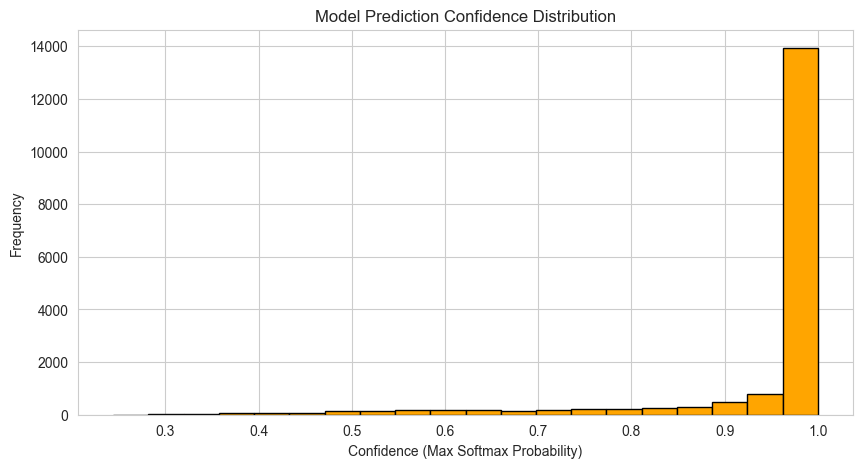

In [39]:
confidences = np.max(y_pred_probs, axis=1)

plt.figure(figsize=(10, 5))
plt.hist(confidences, bins=20, color='orange', edgecolor='black')
plt.title("Model Prediction Confidence Distribution")
plt.xlabel("Confidence (Max Softmax Probability)")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


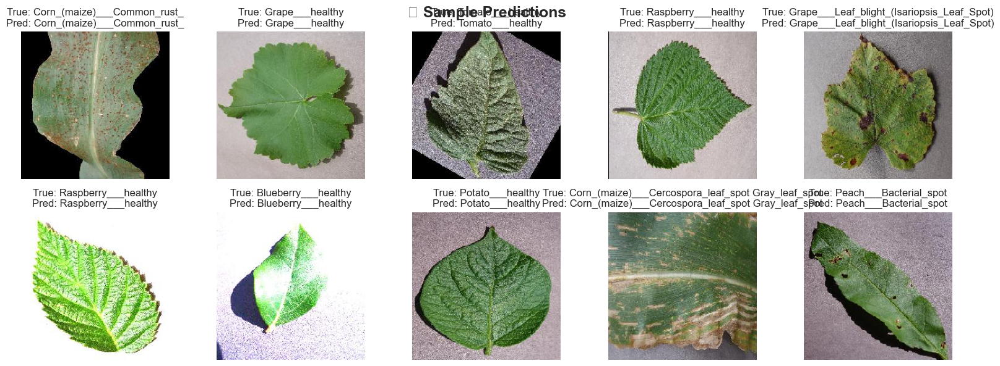

In [42]:
import matplotlib.pyplot as plt
import numpy as np
import random

x_samples, y_samples = [], []
for _ in range(5):  
    x_batch, y_batch = next(val_generator)
    x_samples.extend(x_batch)
    y_samples.extend(y_batch)

sample_indices = random.sample(range(len(x_samples)), 10)

plt.figure(figsize=(16, 6))
for i, idx in enumerate(sample_indices):
    img = x_samples[idx]
    true_label = int(y_samples[idx])
    
    pred = np.argmax(model.predict(np.expand_dims(img, axis=0)), axis=1)[0]

    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.title(f"True: {class_names[true_label]}\nPred: {class_names[pred]}")
    plt.axis('off')

plt.tight_layout()
plt.suptitle("🔍 Sample Predictions", fontsize=18, fontweight='bold')
plt.show()


In [43]:
from collections import Counter

wrong_preds = [(t, p) for t, p in zip(y_true, y_pred) if t != p]
common_confusions = Counter(wrong_preds).most_common(5)

print("Top 5 Misclassifications (True → Pred):")
for (true, pred), count in common_confusions:
    print(f"{class_names[true]} → {class_names[pred]}: {count} times")


Top 5 Misclassifications (True → Pred):
Grape___Esca_(Black_Measles) → Corn_(maize)___Common_rust_: 25 times
Pepper,_bell___Bacterial_spot → Pepper,_bell___healthy: 25 times
Tomato___Leaf_Mold → Tomato___healthy: 23 times
Blueberry___healthy → Orange___Haunglongbing_(Citrus_greening): 22 times
Cherry_(including_sour)___healthy → Grape___Leaf_blight_(Isariopsis_Leaf_Spot): 22 times


/var/folders/h2/wm9znrpn1t91bqtr9g3njc7h0000gn/T/ipykernel_96282/725597672.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=class_names, y=f1s, palette='magma')
/var/folders/h2/wm9znrpn1t91bqtr9g3njc7h0000gn/T/ipykernel_96282/725597672.py:12: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) Arial.
  plt.tight_layout()
/Users/cavins/Desktop/project/leaf-disease-detector/plantenv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


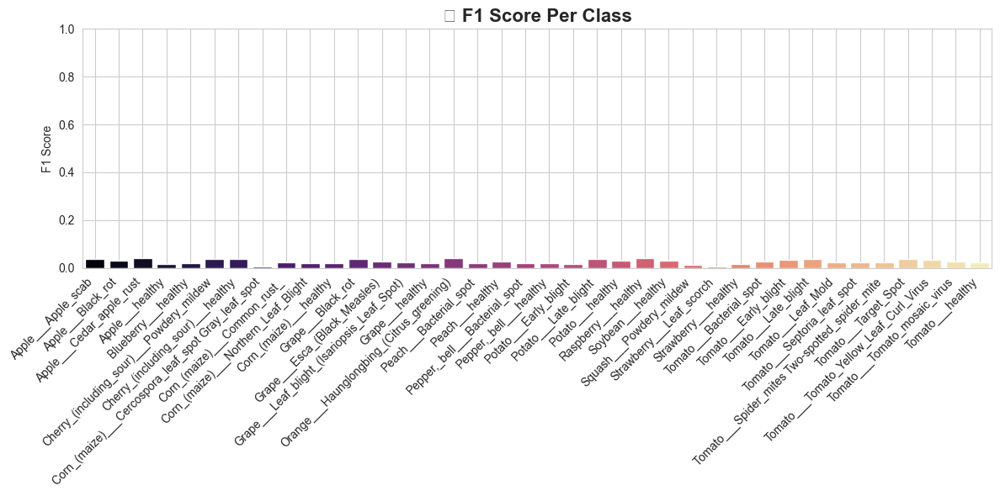

In [50]:
from sklearn.metrics import f1_score

f1s = f1_score(y_true, y_pred, average=None)

plt.figure(figsize=(12, 6))
sns.barplot(x=class_names, y=f1s, palette='magma')
plt.xticks(rotation=45, ha='right')
plt.ylabel("F1 Score")
plt.title("🎯 F1 Score Per Class", fontsize=16, weight='bold')
plt.ylim(0, 1)
plt.grid(True)
plt.tight_layout()
plt.show()


/var/folders/h2/wm9znrpn1t91bqtr9g3njc7h0000gn/T/ipykernel_96282/189260191.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(conf_class_avg.keys()), y=list(conf_class_avg.values()), palette='coolwarm')
/var/folders/h2/wm9znrpn1t91bqtr9g3njc7h0000gn/T/ipykernel_96282/189260191.py:15: UserWarning: Glyph 128274 (\N{LOCK}) missing from font(s) Arial.
  plt.tight_layout()
/Users/cavins/Desktop/project/leaf-disease-detector/plantenv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128274 (\N{LOCK}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


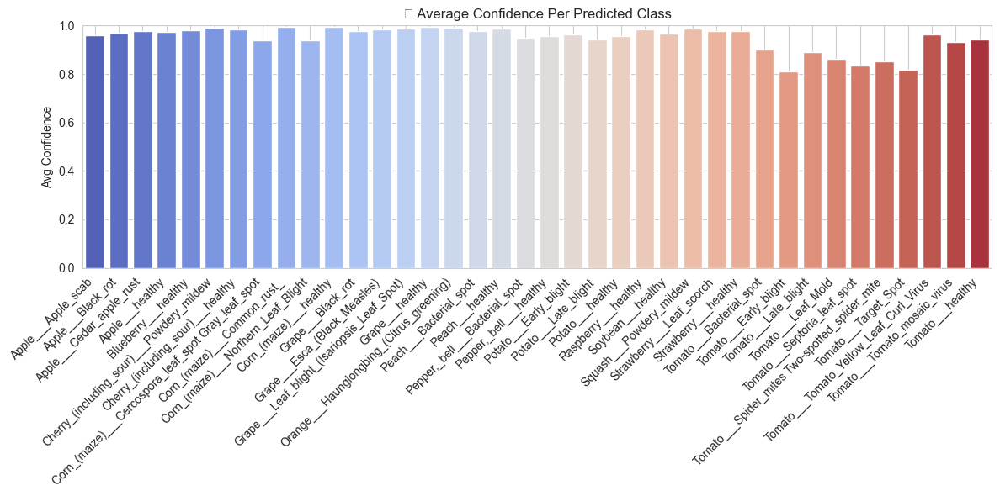

In [51]:
conf_class_avg = {}

for idx, name in enumerate(class_names):
    idxs = np.where(y_pred == idx)[0]
    if len(idxs) > 0:
        conf_class_avg[name] = np.mean(np.max(y_pred_probs[idxs], axis=1))

plt.figure(figsize=(12, 6))
sns.barplot(x=list(conf_class_avg.keys()), y=list(conf_class_avg.values()), palette='coolwarm')
plt.xticks(rotation=45, ha='right')
plt.ylabel("Avg Confidence")
plt.title("🔒 Average Confidence Per Predicted Class")
plt.ylim(0, 1)
plt.grid(True)
plt.tight_layout()
plt.show()


/Users/cavins/Desktop/project/leaf-disease-detector/plantenv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


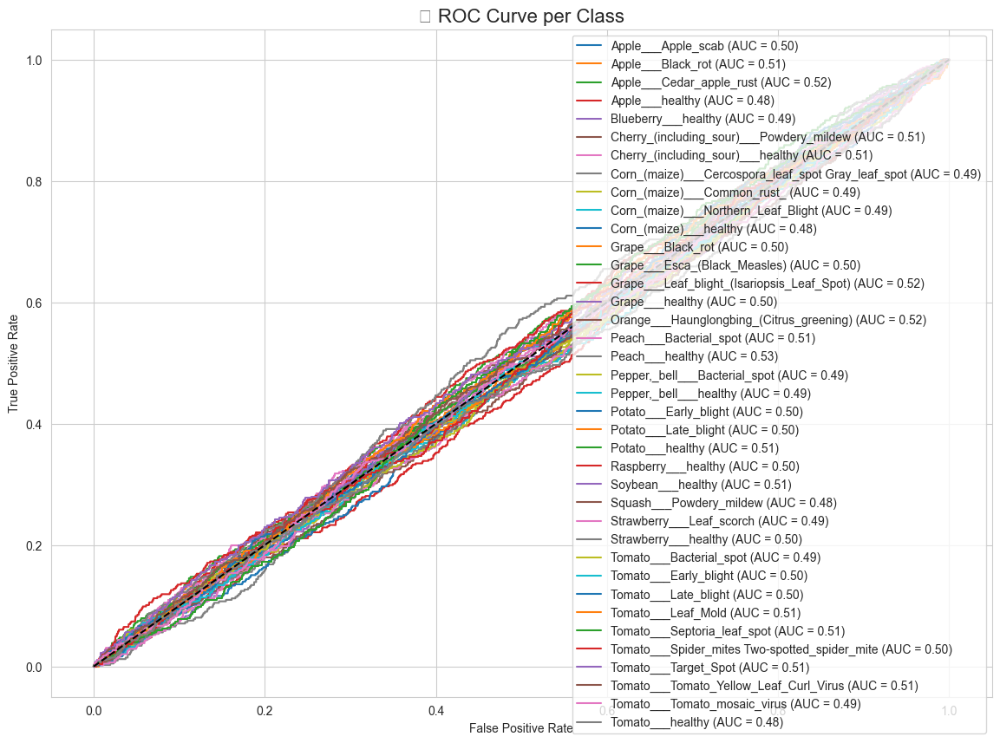

In [52]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarize labels for multi-class ROC
y_true_bin = label_binarize(y_true, classes=list(range(len(class_names))))
fpr, tpr, roc_auc = {}, {}, {}

plt.figure(figsize=(14, 10))

for i in range(len(class_names)):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_pred_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.title('📈 ROC Curve per Class', fontsize=16)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.grid(True)
plt.show()


/var/folders/h2/wm9znrpn1t91bqtr9g3njc7h0000gn/T/ipykernel_96282/2643024325.py:26: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) Arial.
  plt.tight_layout()
/var/folders/h2/wm9znrpn1t91bqtr9g3njc7h0000gn/T/ipykernel_96282/2643024325.py:26: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) Arial.
  plt.tight_layout()
/Users/cavins/Desktop/project/leaf-disease-detector/plantenv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/cavins/Desktop/project/leaf-disease-detector/plantenv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


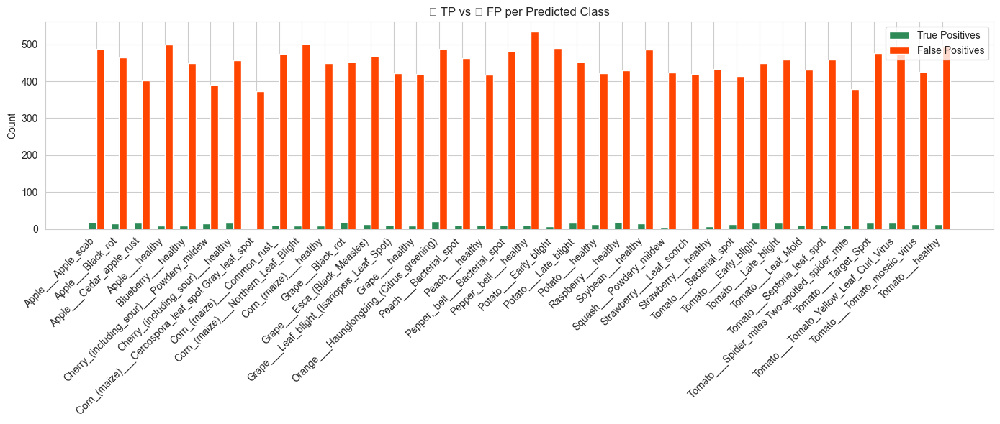

In [55]:
from collections import defaultdict

tp_counts = defaultdict(int)
fp_counts = defaultdict(int)

for true, pred in zip(y_true, y_pred):
    if true == pred:
        tp_counts[class_names[true]] += 1
    else:
        fp_counts[class_names[pred]] += 1

classes = class_names
tp = [tp_counts[c] for c in classes]
fp = [fp_counts[c] for c in classes]

x = np.arange(len(classes))
width = 0.35

plt.figure(figsize=(14, 6))
plt.bar(x - width/2, tp, width, label='True Positives', color='seagreen')
plt.bar(x + width/2, fp, width, label='False Positives', color='orangered')
plt.xticks(x, classes, rotation=45, ha='right')
plt.ylabel("Count")
plt.title("✅ TP vs ❌ FP per Predicted Class")
plt.legend()
plt.tight_layout()
plt.show()


/var/folders/h2/wm9znrpn1t91bqtr9g3njc7h0000gn/T/ipykernel_96282/992019187.py:12: UserWarning: Glyph 128683 (\N{NO ENTRY SIGN}) missing from font(s) Arial.
  plt.tight_layout()
/Users/cavins/Desktop/project/leaf-disease-detector/plantenv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128683 (\N{NO ENTRY SIGN}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


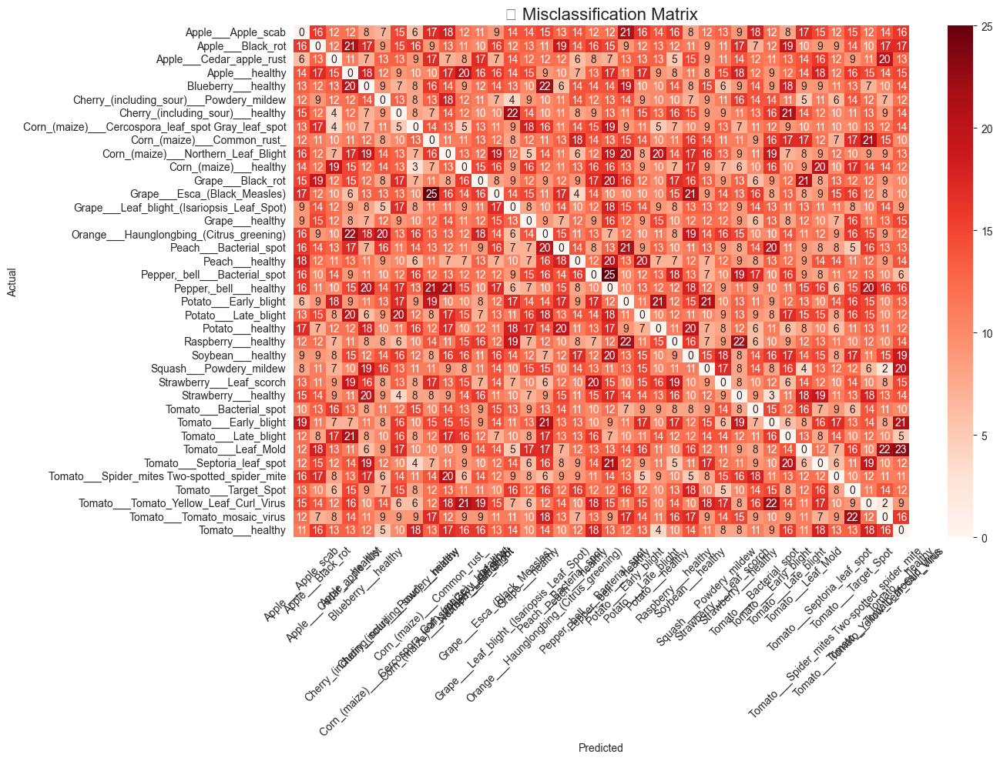

In [56]:
cm = confusion_matrix(y_true, y_pred)
mis_cm = cm.copy()
np.fill_diagonal(mis_cm, 0)

plt.figure(figsize=(14, 10))
sns.heatmap(mis_cm, annot=True, fmt='d', cmap='Reds',
            xticklabels=class_names, yticklabels=class_names)
plt.title("🚫 Misclassification Matrix", fontsize=16)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
from tensorflow.keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import numpy as np

model = load_model("final_leaf_disease_model.keras")

from tensorflow.keras.preprocessing.image import ImageDataGenerator

val_datagen = ImageDataGenerator(rescale=1./255)

val_generator = val_datagen.flow_from_directory(
    "/Users/cavins/Desktop/project/leaf-disease-detector/leaf_dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid", 
    target_size=(224, 224),
    batch_size=32,
    class_mode='sparse',
    shuffle=False  
)

y_true = val_generator.classes
y_pred_probs = model.predict(val_generator, verbose=1)
y_pred = np.argmax(y_pred_probs, axis=1)
class_labels = list(val_generator.class_indices.keys())

print("📊 Overall Evaluation Metrics")
print("-" * 40)
print(f"✅ Accuracy  : {accuracy_score(y_true, y_pred):.4f}")
print(f"🎯 Precision : {precision_score(y_true, y_pred, average='weighted'):.4f}")
print(f"📈 Recall    : {recall_score(y_true, y_pred, average='weighted'):.4f}")
print(f"🏆 F1 Score  : {f1_score(y_true, y_pred, average='weighted'):.4f}")
print("-" * 40)

print("📋 Detailed Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_labels))

print("🧮 Confusion Matrix:")
print(confusion_matrix(y_true, y_pred))


Found 17572 images belonging to 38 classes.


/Users/cavins/Desktop/project/leaf-disease-detector/plantenv/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


550/550 ━━━━━━━━━━━━━━━━━━━━ 196s 356ms/step
📊 Overall Evaluation Metrics
----------------------------------------
✅ Accuracy  : 0.9466
🎯 Precision : 0.9475
📈 Recall    : 0.9466
🏆 F1 Score  : 0.9466
----------------------------------------
📋 Detailed Classification Report:
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.94      0.94      0.94       504
                                 Apple___Black_rot       0.99      0.95      0.97       497
                          Apple___Cedar_apple_rust       1.00      0.95      0.97       440
                                   Apple___healthy       0.98      0.99      0.98       502
                               Blueberry___healthy       0.97      0.98      0.97       454
          Cherry_(including_sour)___Powdery_mildew       1.00      0.96      0.98       421
                 Cherry_(including_sour)___healthy       0.96      0.99      0.97

In [ ]:
#visual representation

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


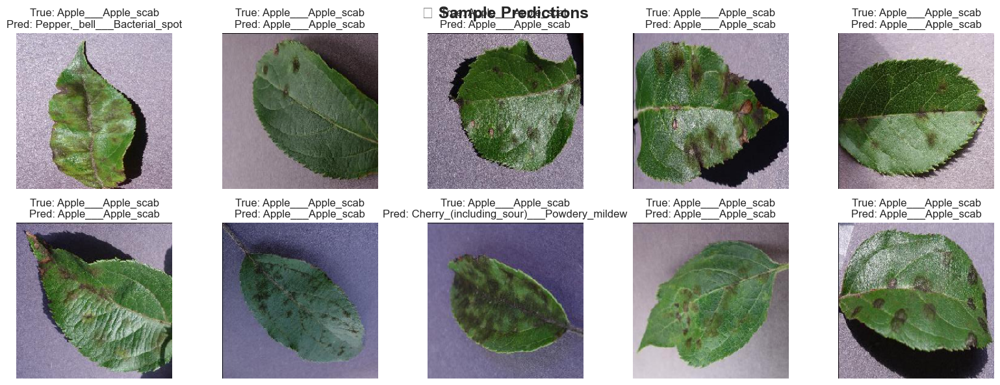

In [63]:
import matplotlib.pyplot as plt
import random
import numpy as np

x_samples, y_samples = [], []
for _ in range(5):
    x_batch, y_batch = next(val_generator)
    x_samples.extend(x_batch)
    y_samples.extend(y_batch)

sample_indices = random.sample(range(len(x_samples)), 10)

plt.figure(figsize=(16, 6))
for i, idx in enumerate(sample_indices):
    img = x_samples[idx]
    true_label = int(y_samples[idx])
    pred_label = np.argmax(model.predict(np.expand_dims(img, axis=0)))
    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.title(f"True: {class_labels[true_label]}\nPred: {class_labels[pred_label]}")
    plt.axis('off')
plt.tight_layout()
plt.suptitle("✅ Sample Predictions", fontsize=18, fontweight='bold')
plt.show()


550/550 ━━━━━━━━━━━━━━━━━━━━ 189s 343ms/step


/var/folders/h2/wm9znrpn1t91bqtr9g3njc7h0000gn/T/ipykernel_96282/690427485.py:26: UserWarning: Glyph 128175 (\N{HUNDRED POINTS SYMBOL}) missing from font(s) Arial.
  plt.tight_layout()
/Users/cavins/Desktop/project/leaf-disease-detector/plantenv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128175 (\N{HUNDRED POINTS SYMBOL}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


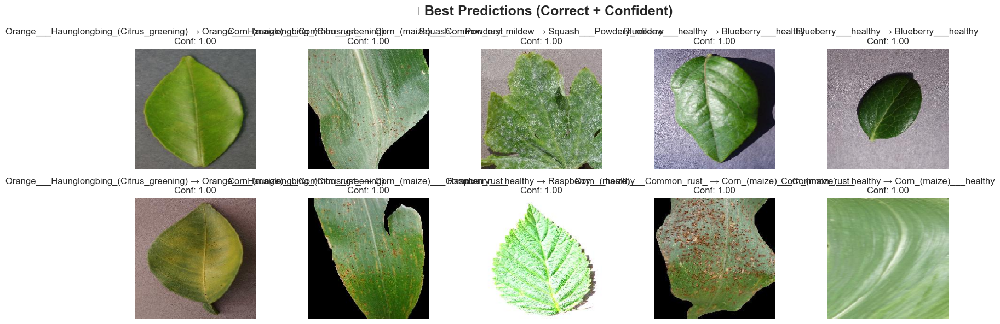

/var/folders/h2/wm9znrpn1t91bqtr9g3njc7h0000gn/T/ipykernel_96282/690427485.py:26: UserWarning: Glyph 128680 (\N{POLICE CARS REVOLVING LIGHT}) missing from font(s) Arial.
  plt.tight_layout()
/Users/cavins/Desktop/project/leaf-disease-detector/plantenv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128680 (\N{POLICE CARS REVOLVING LIGHT}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


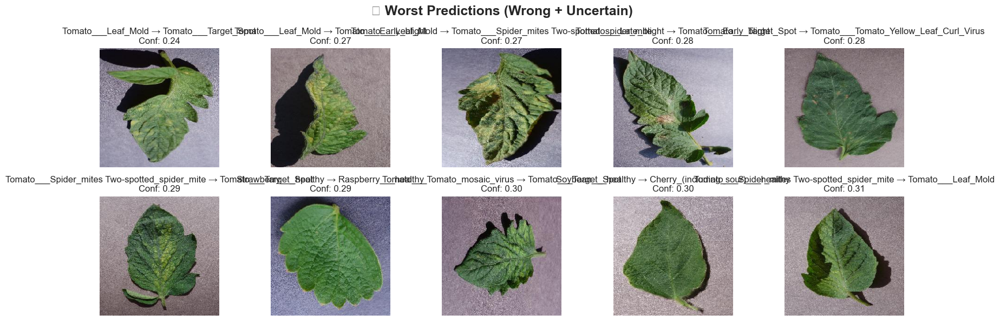

In [64]:
y_pred_probs = model.predict(val_generator, verbose=1)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = val_generator.classes
confidences = np.max(y_pred_probs, axis=1)

correct = np.where(y_pred == y_true)[0]
best = correct[np.argsort(confidences[correct])[-10:]]

wrong = np.where(y_pred != y_true)[0]
worst = wrong[np.argsort(confidences[wrong])[:10]]

def plot_indices(indices, title):
    plt.figure(figsize=(16, 6))
    for i, idx in enumerate(indices):
        img = val_generator[idx // batch_size][0][idx % batch_size]
        t = y_true[idx]
        p = y_pred[idx]
        conf = confidences[idx]
        plt.subplot(2, 5, i + 1)
        plt.imshow(img)
        plt.title(f"{class_labels[t]} → {class_labels[p]}\nConf: {conf:.2f}")
        plt.axis('off')
    plt.suptitle(title, fontsize=18, fontweight='bold')
    plt.tight_layout()
    plt.show()

plot_indices(best, "💯 Best Predictions (Correct + Confident)")
plot_indices(worst, "🚨 Worst Predictions (Wrong + Uncertain)")


/var/folders/h2/wm9znrpn1t91bqtr9g3njc7h0000gn/T/ipykernel_96282/2220502752.py:25: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) Arial.
  plt.tight_layout()
/Users/cavins/Desktop/project/leaf-disease-detector/plantenv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


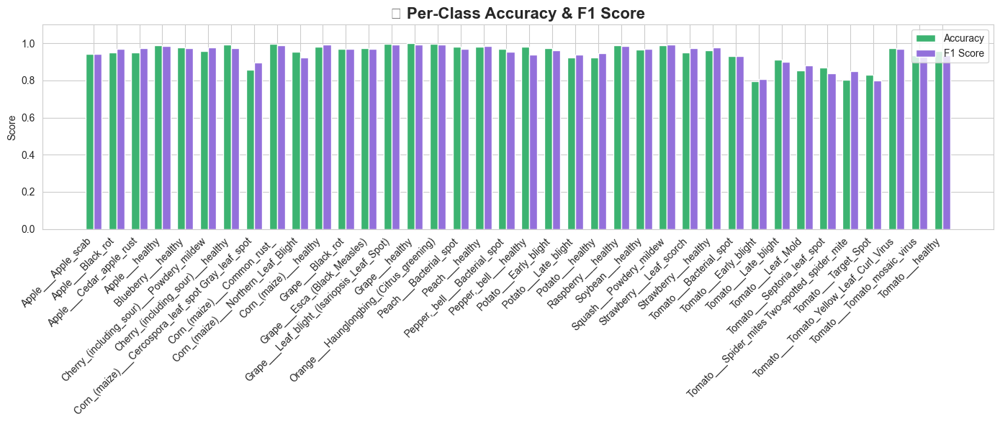

In [65]:
from sklearn.metrics import f1_score

correct = (y_pred == y_true)
class_acc = []
class_f1 = f1_score(y_true, y_pred, average=None)

for i in range(len(class_labels)):
    idxs = np.where(y_true == i)[0]
    acc = np.mean(correct[idxs])
    class_acc.append(acc)

import seaborn as sns
plt.figure(figsize=(14, 6))
x = np.arange(len(class_labels))
width = 0.35

plt.bar(x - width/2, class_acc, width, label='Accuracy', color='mediumseagreen')
plt.bar(x + width/2, class_f1, width, label='F1 Score', color='mediumpurple')

plt.xticks(x, class_labels, rotation=45, ha='right')
plt.ylabel("Score")
plt.ylim(0, 1.1)
plt.title("🎯 Per-Class Accuracy & F1 Score", fontsize=16, fontweight='bold')
plt.legend()
plt.tight_layout()
plt.show()


/var/folders/h2/wm9znrpn1t91bqtr9g3njc7h0000gn/T/ipykernel_96282/2317872978.py:13: UserWarning: Glyph 128683 (\N{NO ENTRY SIGN}) missing from font(s) Arial.
  plt.tight_layout()
/Users/cavins/Desktop/project/leaf-disease-detector/plantenv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128683 (\N{NO ENTRY SIGN}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


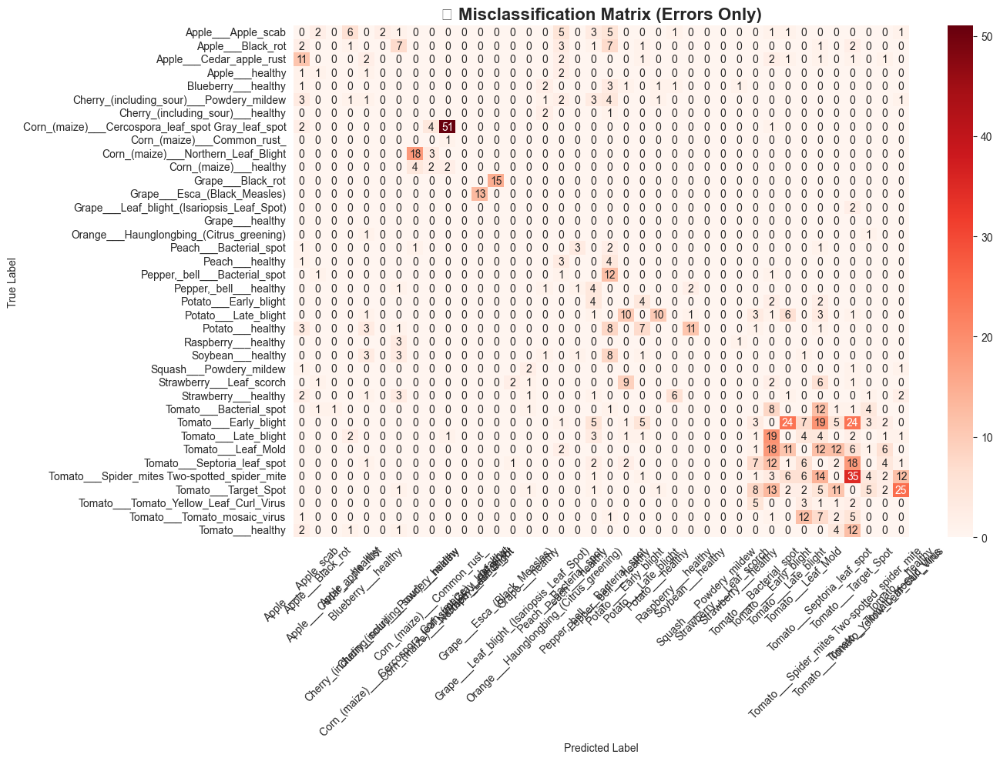

In [66]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_true, y_pred)
mis_cm = cm.copy()
np.fill_diagonal(mis_cm, 0)

plt.figure(figsize=(14, 10))
sns.heatmap(mis_cm, annot=True, fmt='d', cmap='Reds',
            xticklabels=class_labels, yticklabels=class_labels)
plt.title("🚫 Misclassification Matrix (Errors Only)", fontsize=16, weight='bold')
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


/var/folders/h2/wm9znrpn1t91bqtr9g3njc7h0000gn/T/ipykernel_96282/857254449.py:7: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) Arial.
  plt.tight_layout()
/Users/cavins/Desktop/project/leaf-disease-detector/plantenv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


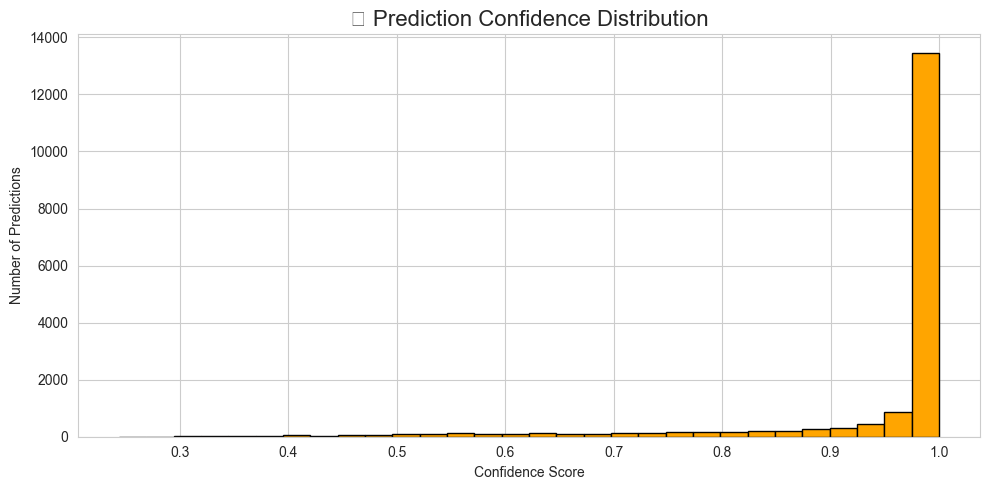

In [67]:
plt.figure(figsize=(10, 5))
plt.hist(confidences, bins=30, color='orange', edgecolor='black')
plt.title("📊 Prediction Confidence Distribution", fontsize=16)
plt.xlabel("Confidence Score")
plt.ylabel("Number of Predictions")
plt.grid(True)
plt.tight_layout()
plt.show()
